<p style="align: center;"><img align=center src="https://cdnb.artstation.com/p/assets/covers/images/060/407/559/large/vahid-ghobadi-arfai-vahid-ghobadi-arfai-lo.jpg?1678483232" width=300 height=320/></p>
<h3 style="text-align: center;"><b>Семинар №8 ФЭФМ МФТИ</b></h3>

# Потоки и сети в графах

V — множество вершин (узлов),
E — множество рёбер (дуг), которые соединяют вершины.

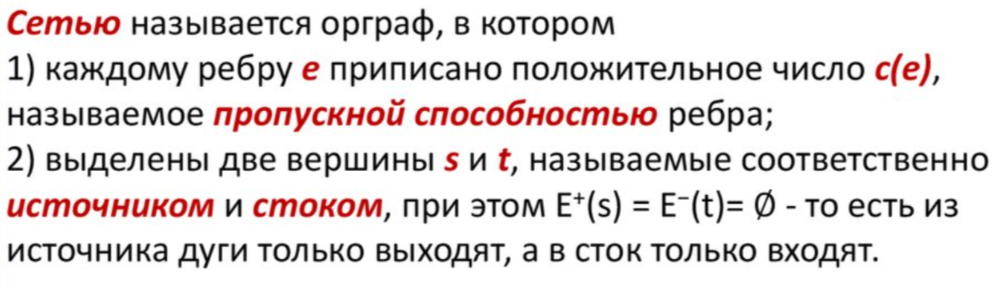

Каждое ребро имеет пропускную способность c(u,v)≥0, которая определяет максимальное количество ресурса, которое может проходить через это ребро. 

Например, если пропускная способность ребра B0 - B1 равна 3, а ребра В1 - В2 — 4, то это означает, что путём B0 - В1 можно пропустить 3 машины в единицу времени, а путём B1 - В2 — 4 машины. 

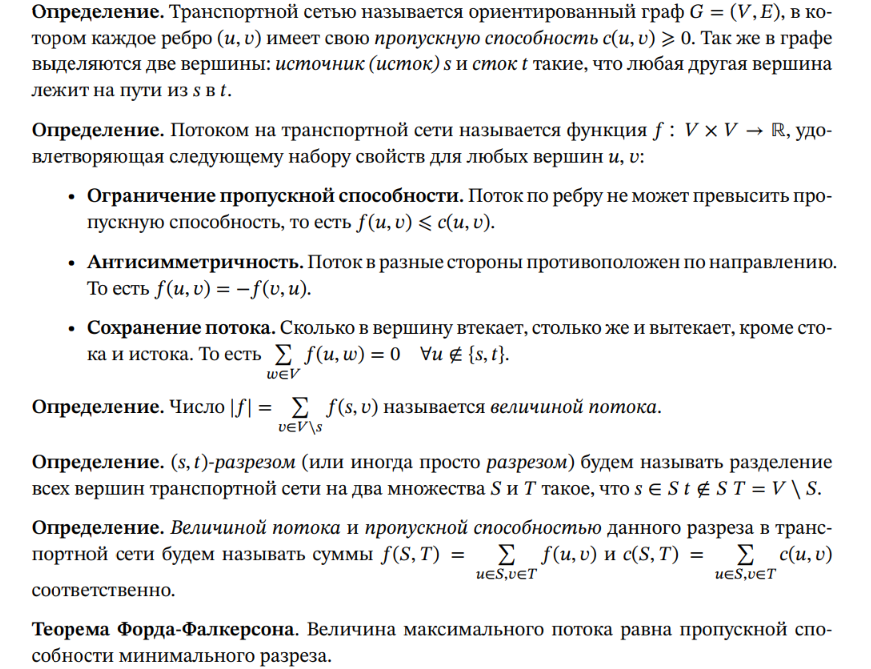

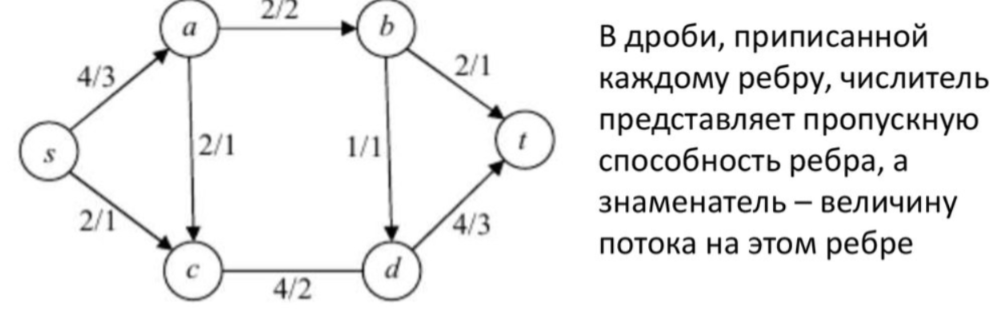

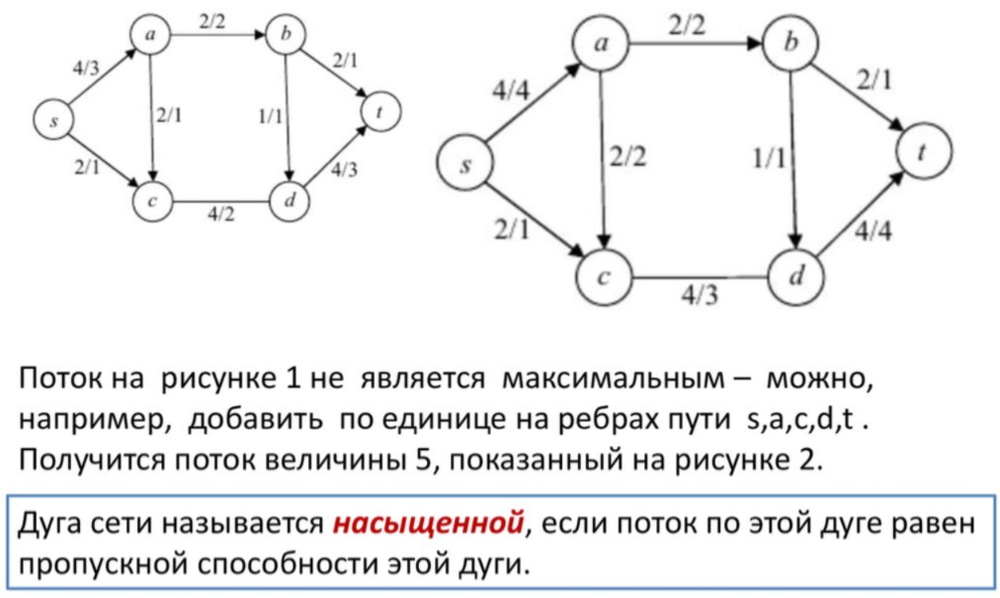

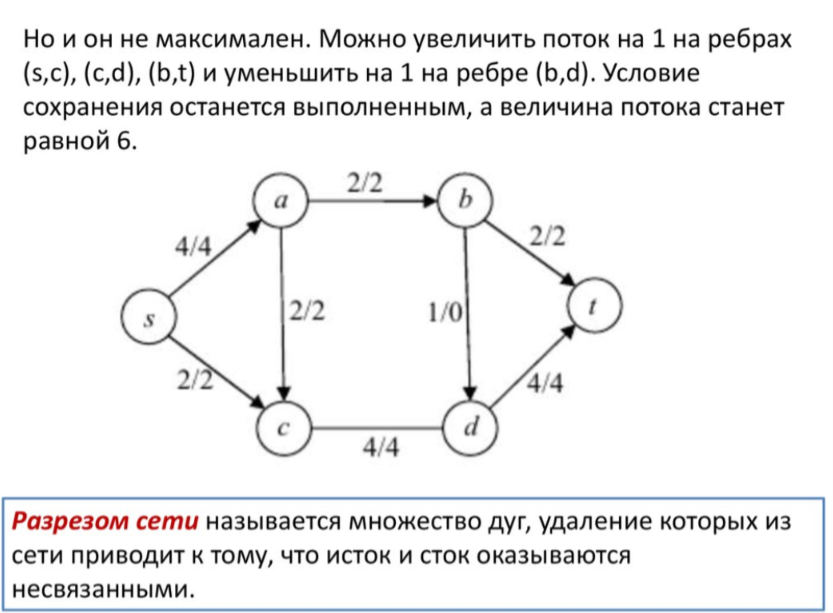

# Алгоритм Форда Фалкерсона

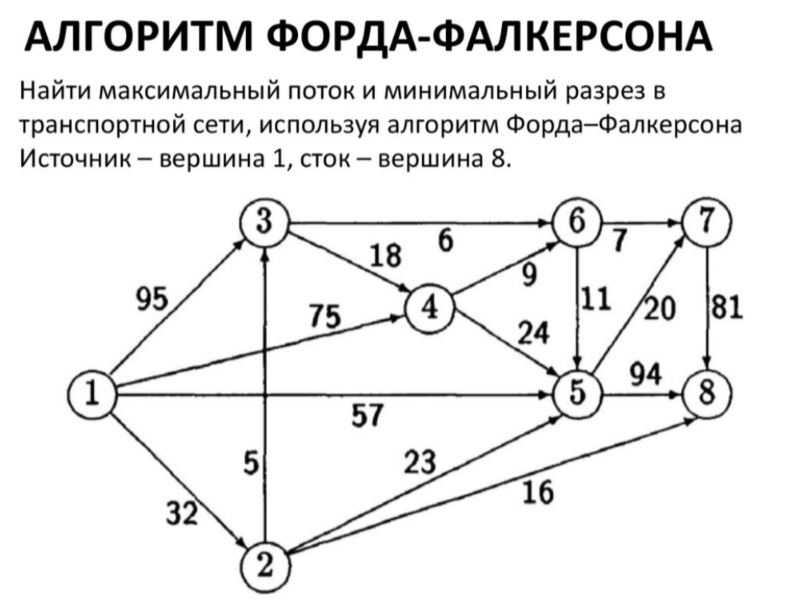

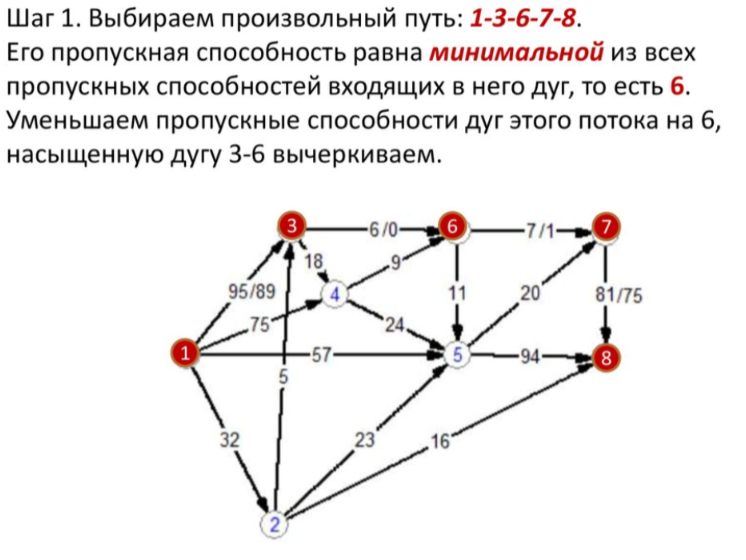

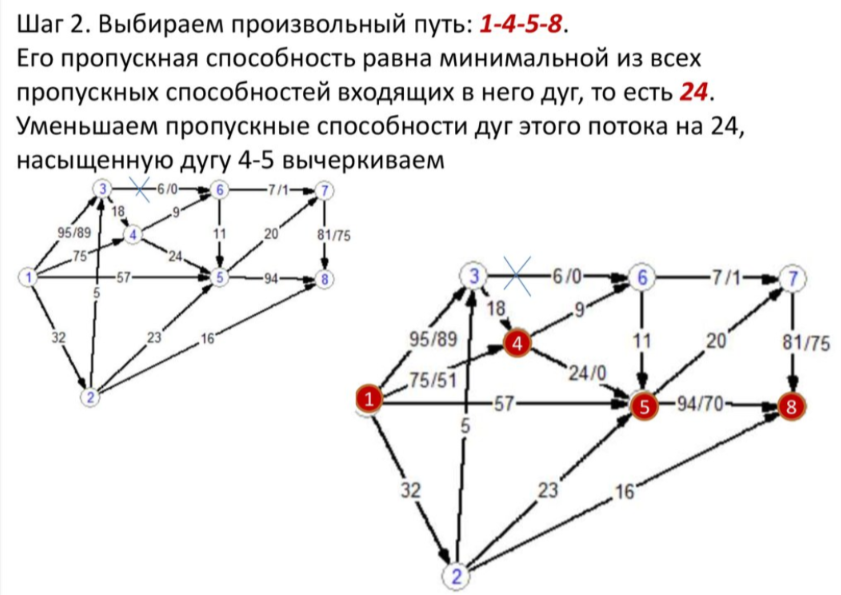

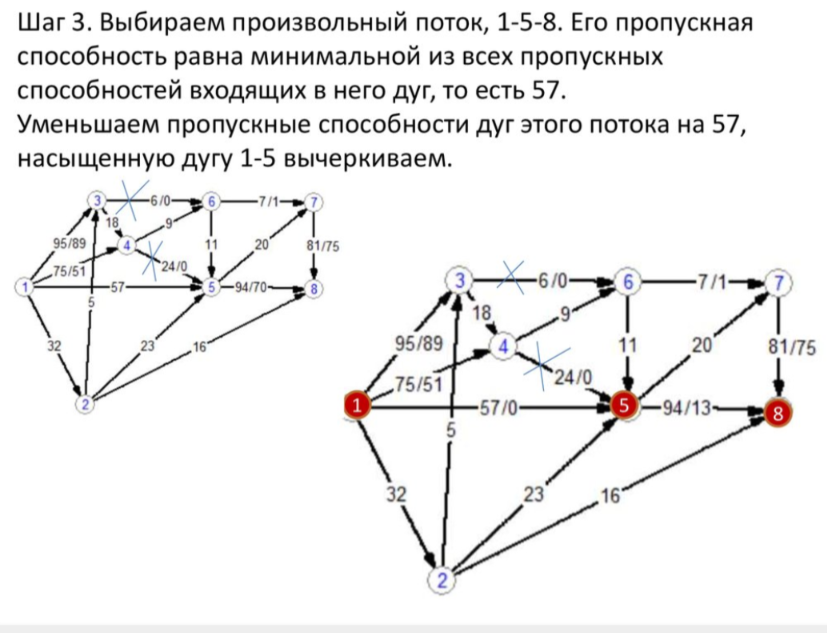

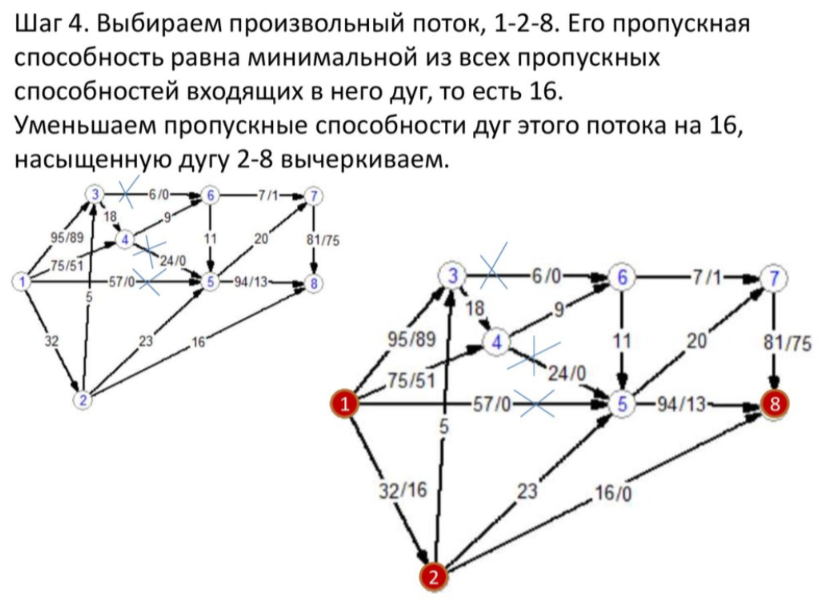

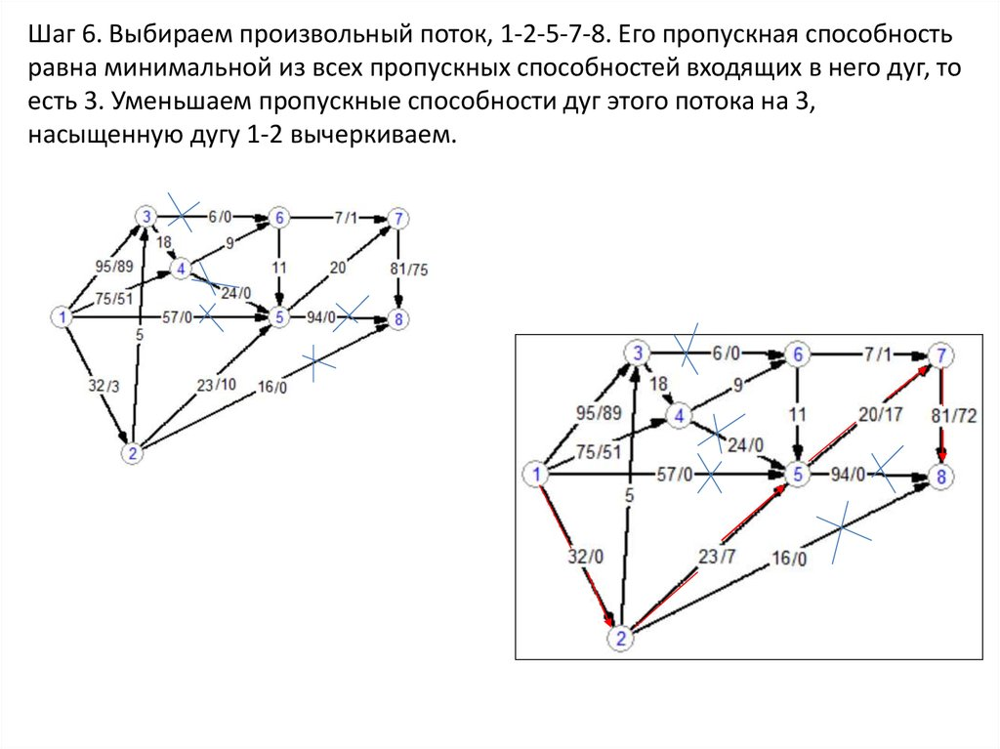

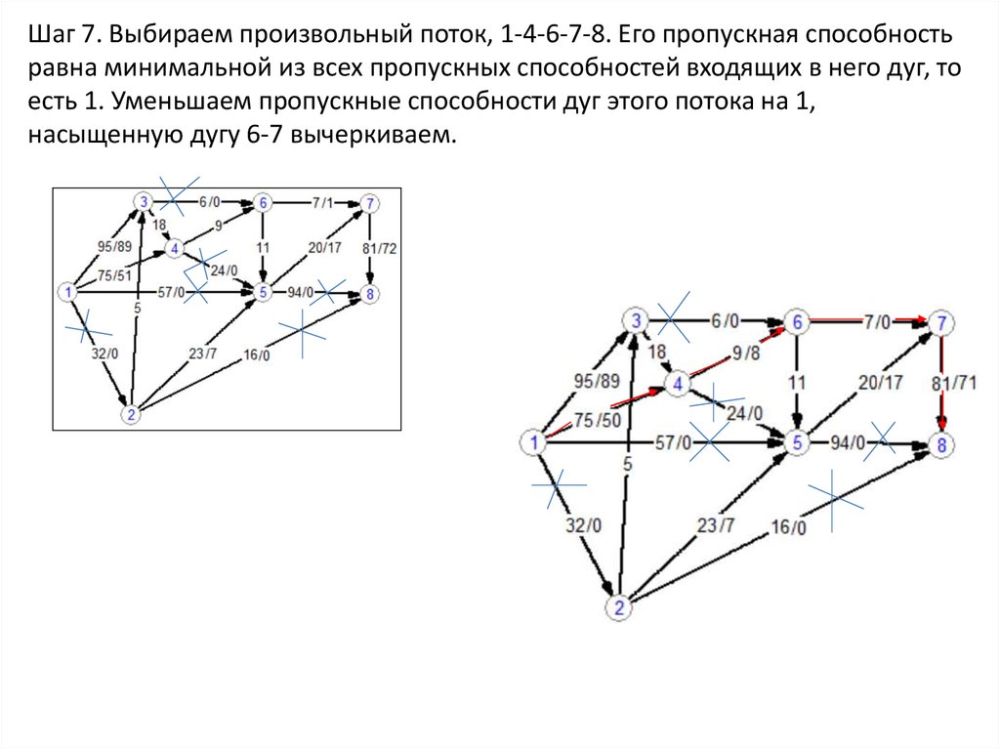

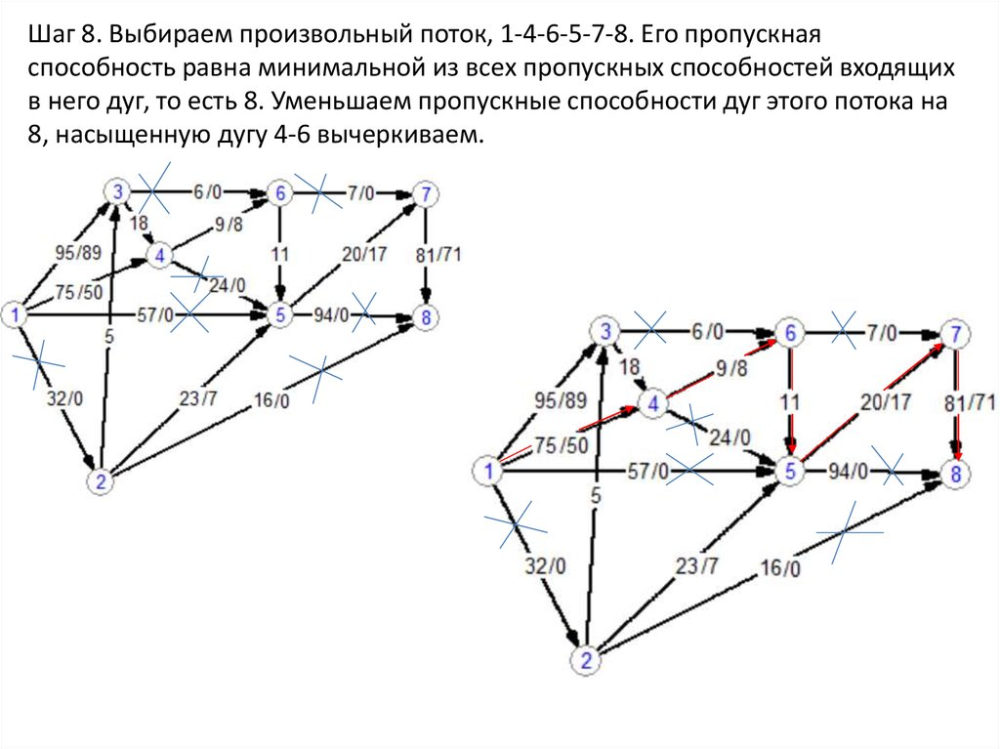

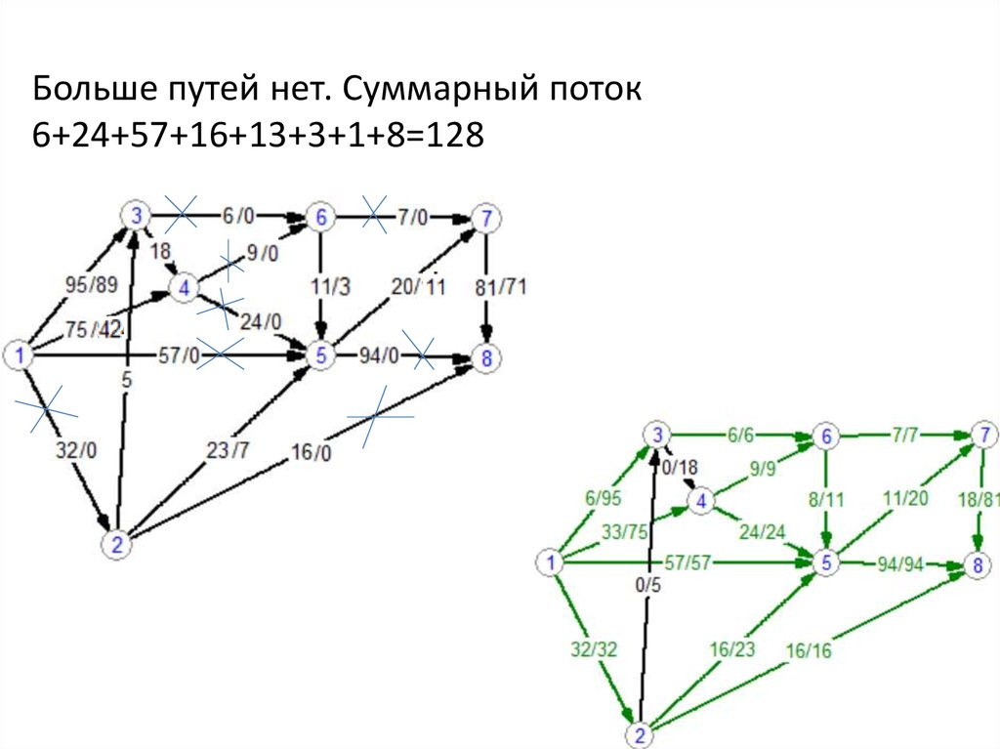

Еще один пример

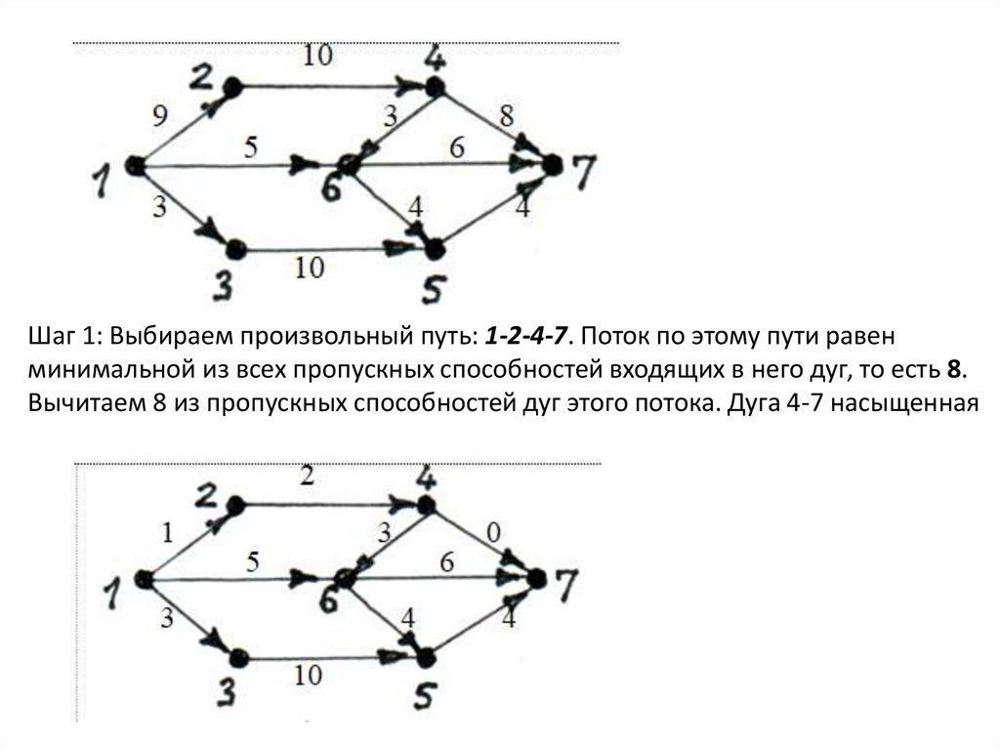

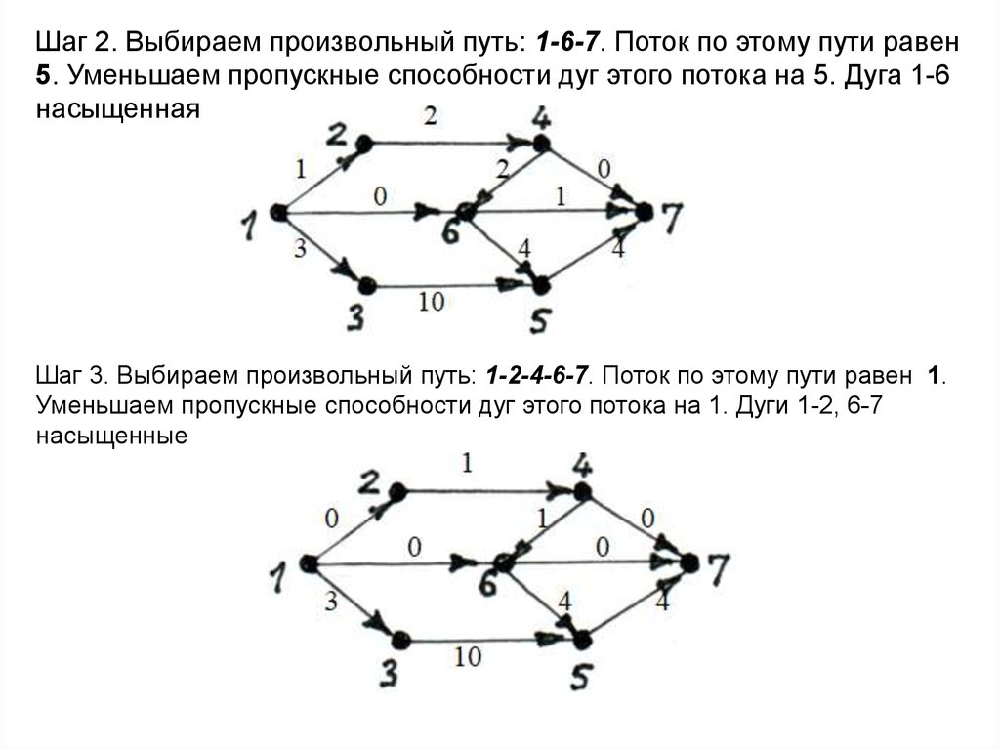

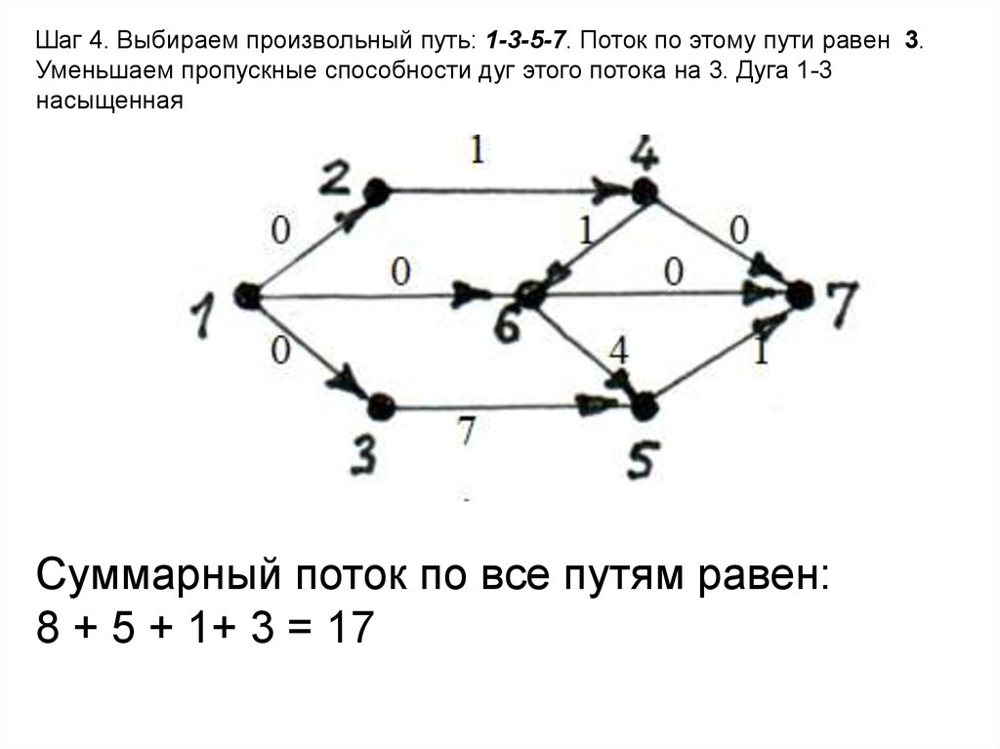

Теперь реализуем код

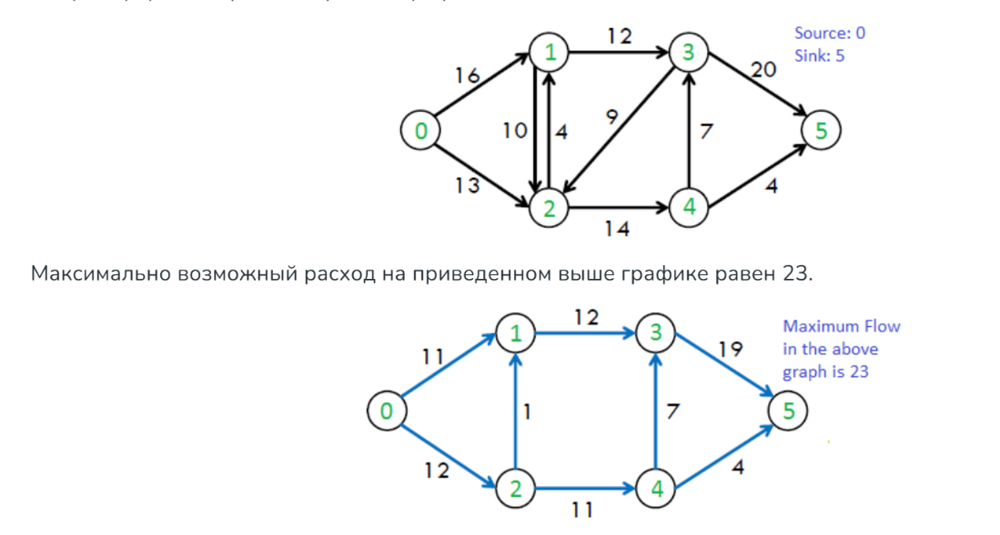

BFS используется для поиска пути от истока к стоку в остаточном графе.

FordFulkerson:

Находит путь с помощью BFS.

Определяет минимальную пропускную способность на этом пути.

Увеличивает общий поток на эту величину.

Обновляет остаточные пропускные способности рёбер.

In [7]:
from collections import defaultdict

class Graph:

    def __init__(self, graph):
        self.graph = graph  
        self.ROW = len(graph)  # Количество вершин в графе

    def BFS(self, s, t, parent):
        visited = [False] * (self.ROW)
        queue = []
        queue.append(s)
        visited[s] = True
        while queue:
            u = queue.pop(0)
            # Перебираем все смежные вершины
            for ind, val in enumerate(self.graph[u]):
                # Если вершина не посещена и остаточная пропускная способность больше 0
                if visited[ind] == False and val > 0:
                    # Добавляем вершину в очередь и отмечаем как посещённую
                    queue.append(ind)
                    visited[ind] = True
                    parent[ind] = u  # Сохраняем текущую вершину как родительскую
                    # Если достигли стока, возвращаем True
                    if ind == t:
                        return True
        # Если сток не достигнут, возвращаем False
        return False

    def FordFulkerson(self, source, sink):
        # Массив для хранения пути, найденного BFS
        parent = [-1] * (self.ROW)
        max_flow = 0  
        while self.BFS(source, sink, parent):
            # Находим минимальную остаточную пропускную способность на пути
            path_flow = float("Inf")
            s = sink
            while s != source:
                path_flow = min(path_flow, self.graph[parent[s]][s])
                s = parent[s]
            max_flow += path_flow
            # Обновляем остаточные пропускные способности рёбер и обратных рёбер
            v = sink
            while v != source:
                u = parent[v]
                self.graph[u][v] -= path_flow  
                self.graph[v][u] += path_flow  
                v = parent[v]
        return max_flow


graph = [
    [0, 16, 13, 0, 0, 0], 
    [0, 0, 10, 12, 0, 0], 
    [0, 4, 0, 0, 14, 0],   
    [0, 0, 9, 0, 0, 20], 
    [0, 0, 0, 7, 0, 4],   
    [0, 0, 0, 0, 0, 0]     
]

g = Graph(graph)

# Задаём исток и сток
source = 0
sink = 5

print("Максимальный возможный поток равен %d" % g.FordFulkerson(source, sink))

Максимальный возможный поток равен 23


Как работают обратные рёбра?
В остаточном графе каждое прямое ребро имеет пропускную способность, равную исходной пропускной способности.
Обратные рёбра изначально имеют пропускную способность 0

После отправки потока:

Если по ребру (u,v) прошёл поток величиной f, то:
Пропускная способность прямого ребра (u,v) уменьшается на f

Пропускная способность обратного ребра (v,u) увеличивается на f


Пусть есть ребро (u,v) с пропускной способностью 10

Если по нему прошёл поток 4, то (u,v) теперь имеет пропускную способность 10−4=6

Обратное ребро (v,u) теперь имеет пропускную способность 0+4=4

Обратные рёбра позволяют алгоритму "отменять" часть уже отправленного потока и перенаправлять его по другим путям. Это важно, потому что изначально выбранный путь может не быть оптимальным, и обратные рёбра дают возможность исправить это.

### Пример когда обратные ребра не нужны

In [83]:
from collections import defaultdict

class Graph:

    def __init__(self, graph):
        self.graph = graph  
        self.ROW = len(graph)  # Количество вершин в графе

    '''Метод BFS (поиск в ширину) для поиска пути от истока 's' до стока 't'.
       Также заполняет массив parent[], чтобы сохранить путь.'''
    def BFS(self, s, t, parent):
        # Массив для отметки посещённых вершин
        visited = [False] * (self.ROW)
        # Очередь для BFS
        queue = []
        # Отмечаем исходную вершину как посещённую и добавляем её в очередь
        queue.append(s)
        visited[s] = True
        # Основной цикл BFS
        while queue:
            # Извлекаем вершину из очереди
            u = queue.pop(0)
            # Перебираем все смежные вершины
            for ind, val in enumerate(self.graph[u]):
                # Если вершина не посещена и остаточная пропускная способность больше 0
                if visited[ind] == False and val > 0:
                    # Добавляем вершину в очередь и отмечаем как посещённую
                    queue.append(ind)
                    visited[ind] = True
                    parent[ind] = u  # Сохраняем текущую вершину как родительскую
                    # Если достигли стока, возвращаем True
                    if ind == t:
                        return True
        # Если сток не достигнут, возвращаем False
        return False
    # Сам метод для нахождения максимального потока с использованием алгоритма Форда-Фалкерсона
    def FordFulkerson(self, source, sink):
        # Массив для хранения пути, найденного BFS
        parent = [-1] * (self.ROW)
        max_flow = 0  # Изначально поток равен 0
        # Пока существует путь от истока к стоку
        while self.BFS(source, sink, parent):
            # Находим минимальную остаточную пропускную способность на пути
            path_flow = float("Inf")
            s = sink
            while s != source:
                path_flow = min(path_flow, self.graph[parent[s]][s])
                s = parent[s]
            # Добавляем поток пути к общему потоку
            max_flow += path_flow
            # Обновляем остаточные пропускные способности рёбер и обратных рёбер
            v = sink
            while v != source:
                u = parent[v]
                self.graph[u][v] -= path_flow  # Уменьшаем пропускную способность прямого ребра
                v = parent[v]
        return max_flow


graph = [
    [0, 3, 2, 0],  # 0 -> 1, 0 -> 2
    [0, 0, 2, 2],  # 1 -> 2, 1 -> 3
    [0, 0, 0, 3],  # 2 -> 3
    [0, 0, 0, 0]   # Сток (3)
]

g = Graph(graph)

# Задаём исток и сток
source = 0
sink = 3

print("Максимальный возможный поток равен %d" % g.FordFulkerson(source, sink))

Максимальный возможный поток равен 5


## Пример когда они нужны

In [ ]:
graph = [
    [0, 1, 1, 0, 0],  # s (0) -> a (1), s (0) -> b (2)
    [0, 0, 0, 1, 0],  # a (1) -> c (3)
    [0, 0, 0, 1, 1],  # b (2) -> c (3), b (2) -> d (4)
    [0, 0, 0, 0, 1],  # c (3) -> t (5)
    [0, 0, 0, 0, 0]   # d (4) -> t (5)
]

In [1]:
from collections import defaultdict

class Graph:

    def __init__(self, graph):
        self.graph = graph  
        self.ROW = len(graph)  # Количество вершин в графе

    '''Метод BFS (поиск в ширину) для поиска пути от истока 's' до стока 't'.
       Также заполняет массив parent[], чтобы сохранить путь.'''
    def BFS(self, s, t, parent):
        # Массив для отметки посещённых вершин
        visited = [False] * (self.ROW)
        # Очередь для BFS
        queue = []
        # Отмечаем исходную вершину как посещённую и добавляем её в очередь
        queue.append(s)
        visited[s] = True
        # Основной цикл BFS
        while queue:
            # Извлекаем вершину из очереди
            u = queue.pop(0)
            # Перебираем все смежные вершины
            for ind, val in enumerate(self.graph[u]):
                # Если вершина не посещена и остаточная пропускная способность больше 0
                if visited[ind] == False and val > 0:
                    # Добавляем вершину в очередь и отмечаем как посещённую
                    queue.append(ind)
                    visited[ind] = True
                    parent[ind] = u  # Сохраняем текущую вершину как родительскую
                    # Если достигли стока, возвращаем True
                    if ind == t:
                        return True
        # Если сток не достигнут, возвращаем False
        return False

    # Сам метод для нахождения максимального потока с использованием алгоритма Форда-Фалкерсона
    def FordFulkerson(self, source, sink):
        # Массив для хранения пути, найденного BFS
        parent = [-1] * (self.ROW)
        max_flow = 0  # Изначально поток равен 0
        # Пока существует путь от истока к стоку
        while self.BFS(source, sink, parent):
            # Находим минимальную остаточную пропускную способность на пути
            path_flow = float("Inf")
            s = sink
            while s != source:
                path_flow = min(path_flow, self.graph[parent[s]][s])
                s = parent[s]
            # Добавляем поток пути к общему потоку
            max_flow += path_flow
            # Обновляем остаточные пропускные способности рёбер и обратных рёбер
            v = sink
            while v != source:
                u = parent[v]
                self.graph[u][v] -= path_flow  # Уменьшаем пропускную способность прямого ребра
                v = parent[v]
        return max_flow
graph = [
    [0, 1, 1, 0, 0],  # s (0) -> a (1), s (0) -> b (2)
    [0, 0, 0, 1, 0],  # a (1) -> c (3)
    [0, 0, 0, 1, 1],  # b (2) -> c (3), b (2) -> d (4)
    [0, 0, 0, 0, 1],  # c (3) -> t (5)
    [0, 0, 0, 0, 0]   # d (4) -> t (5)
]

g = Graph(graph)

# Задаём исток и сток
source = 0
sink = 4

print("Максимальный возможный поток равен %d" % g.FordFulkerson(source, sink))

Максимальный возможный поток равен 2


Почему тут корректно отработало и без обратных ребер?

## Еще один пример, посидите посмотрите на него

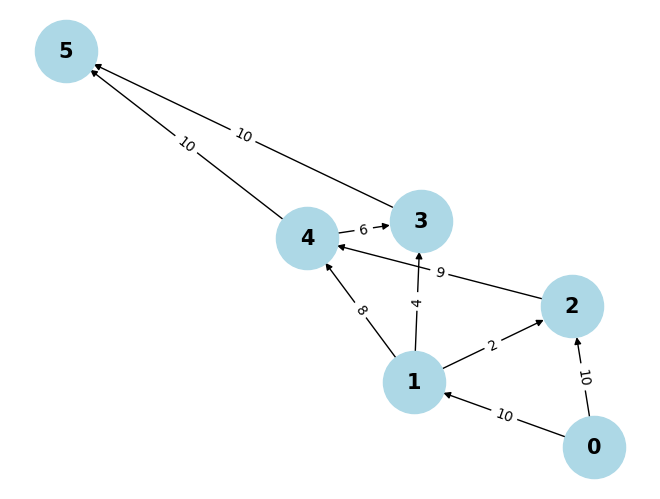

In [72]:
import networkx as nx
import matplotlib.pyplot as plt

graph = [
    [0, 10, 10, 0, 0, 0],  # Вершина 0 (исток)
    [0, 0, 2, 4, 8, 0],    # Вершина 1
    [0, 0, 0, 0, 9, 0],    # Вершина 2
    [0, 0, 0, 0, 0, 10],   # Вершина 3
    [0, 0, 0, 6, 0, 10],   # Вершина 4
    [0, 0, 0, 0, 0, 0]     # Вершина 5 (сток)
]

G = nx.DiGraph()
for i in range(len(graph)):
    for j in range(len(graph[i])):
        if graph[i][j] != 0:
            G.add_edge(i, j, weight=graph[i][j])

pos = nx.spring_layout(G)

nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=2000, font_size=15, font_weight='bold')

labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)

plt.show()

In [75]:
from collections import defaultdict

class Graph:
    def __init__(self, graph):
        self.graph = graph
        self.ROW = len(graph)

    def BFS(self, s, t, parent):
        visited = [False] * self.ROW
        queue = [s]
        visited[s] = True

        while queue:
            u = queue.pop(0)
            for ind, val in enumerate(self.graph[u]):
                if not visited[ind] and val > 0:
                    queue.append(ind)
                    visited[ind] = True
                    parent[ind] = u
                    if ind == t:
                        return True
        return False

    def FordFulkerson(self, source, sink):
        parent = [-1] * self.ROW
        max_flow = 0

        while self.BFS(source, sink, parent):
            path_flow = float("Inf")
            s = sink
            while s != source:
                path_flow = min(path_flow, self.graph[parent[s]][s])
                s = parent[s]
            
            max_flow += path_flow
            v = sink
            print("Путь найден с потоком:", path_flow)
            while v != source:
                u = parent[v]
                print(u, v)
                print(f"Уменьшаем прямое ребро {u} -> {v} на {path_flow}. Остаточная пропускная способность: {self.graph[u][v] - path_flow}")
                self.graph[u][v] -= path_flow
                print(f"Увеличиваем обратное ребро {v} -> {u} на {path_flow}. Новая пропускная способность обратного ребра: {self.graph[v][u] + path_flow}")
                self.graph[v][u] += path_flow
                v = parent[v]
                print (v)
            print("Текущий остаточный граф:")
            for row in self.graph:
                print(row)
            print("---")
        
        return max_flow

graph = [
    [0, 10, 10, 0, 0, 0],  # Вершина 0 (исток)
    [0, 0, 2, 4, 8, 0],    # Вершина 1
    [0, 0, 0, 0, 9, 0],    # Вершина 2
    [0, 0, 0, 0, 0, 10],   # Вершина 3
    [0, 0, 0, 6, 0, 10],   # Вершина 4
    [0, 0, 0, 0, 0, 0]     # Вершина 5 (сток)
]

g = Graph(graph)
source, sink = 0, 5
print("Максимальный возможный поток равен", g.FordFulkerson(source, sink))

Путь найден с потоком: 4
3 5
Уменьшаем прямое ребро 3 -> 5 на 4. Остаточная пропускная способность: 6
3
1 3
Уменьшаем прямое ребро 1 -> 3 на 4. Остаточная пропускная способность: 0
1
0 1
Уменьшаем прямое ребро 0 -> 1 на 4. Остаточная пропускная способность: 6
0
Текущий остаточный граф:
[0, 6, 10, 0, 0, 0]
[0, 0, 2, 0, 8, 0]
[0, 0, 0, 0, 9, 0]
[0, 0, 0, 0, 0, 6]
[0, 0, 0, 6, 0, 10]
[0, 0, 0, 0, 0, 0]
---
Путь найден с потоком: 6
4 5
Уменьшаем прямое ребро 4 -> 5 на 6. Остаточная пропускная способность: 4
4
1 4
Уменьшаем прямое ребро 1 -> 4 на 6. Остаточная пропускная способность: 2
1
0 1
Уменьшаем прямое ребро 0 -> 1 на 6. Остаточная пропускная способность: 0
0
Текущий остаточный граф:
[0, 0, 10, 0, 0, 0]
[0, 0, 2, 0, 2, 0]
[0, 0, 0, 0, 9, 0]
[0, 0, 0, 0, 0, 6]
[0, 0, 0, 6, 0, 4]
[0, 0, 0, 0, 0, 0]
---
Путь найден с потоком: 4
4 5
Уменьшаем прямое ребро 4 -> 5 на 4. Остаточная пропускная способность: 0
4
2 4
Уменьшаем прямое ребро 2 -> 4 на 4. Остаточная пропускная способность: 5
2
0 2


# Алгоритм Диница

Дан граф, представляющий собой сеть потоков, в которой каждое ребро имеет пропускную способность. Также заданы две вершины — источник «s» и сток «t» — в графе. Найдите максимально возможный поток из s в t при следующих ограничениях:

Поток по кромке не превышает заданную пропускную способность.
Входящий поток равен исходящему для каждой вершины, кроме s и t.

То есть Вы получаете:

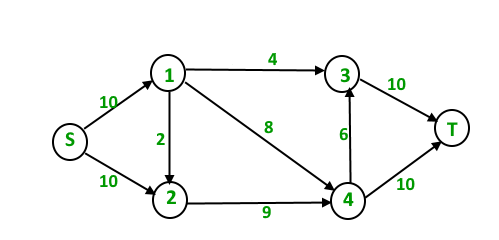

И отдаете после выполнения 19, так как:

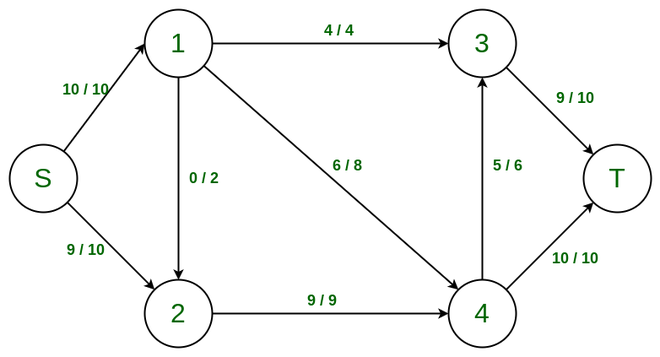

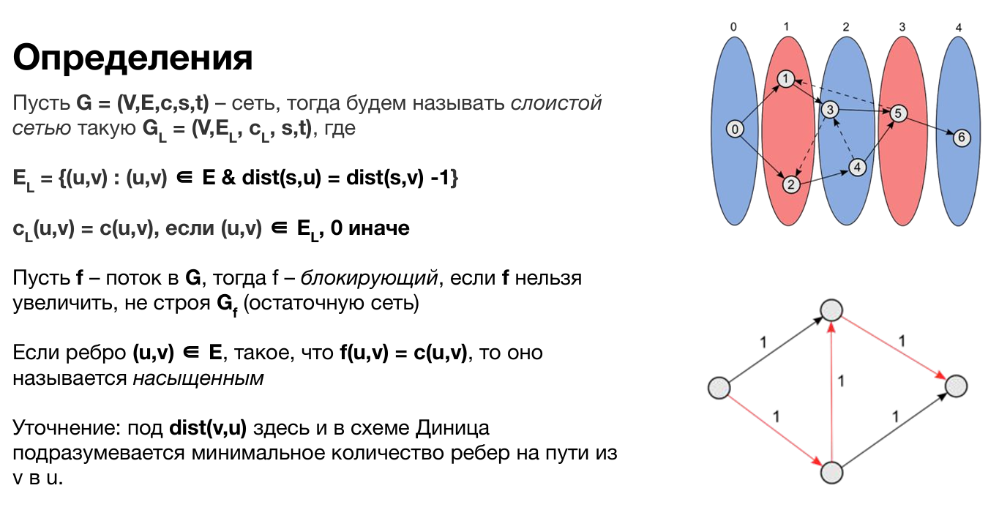

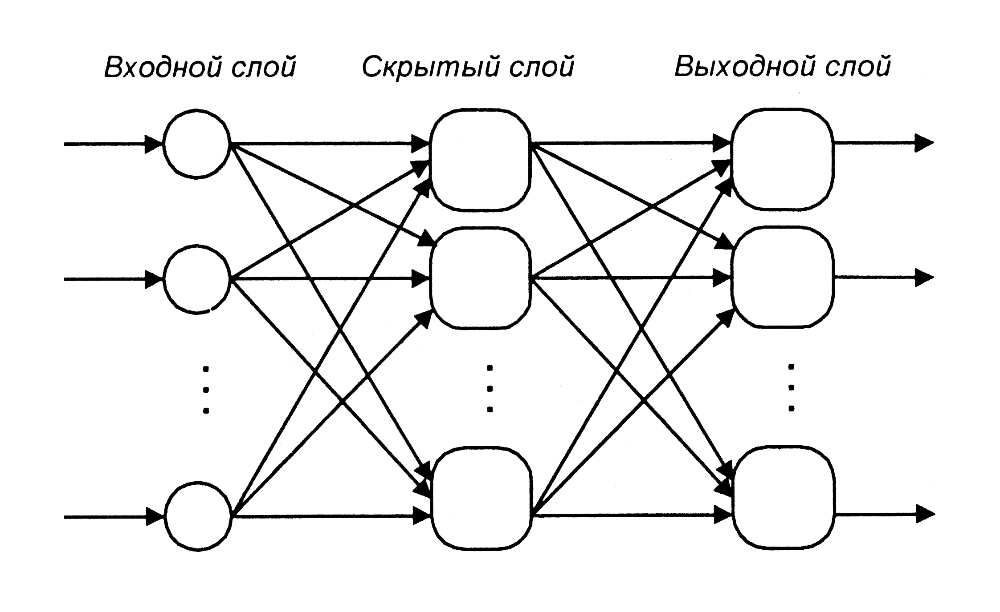

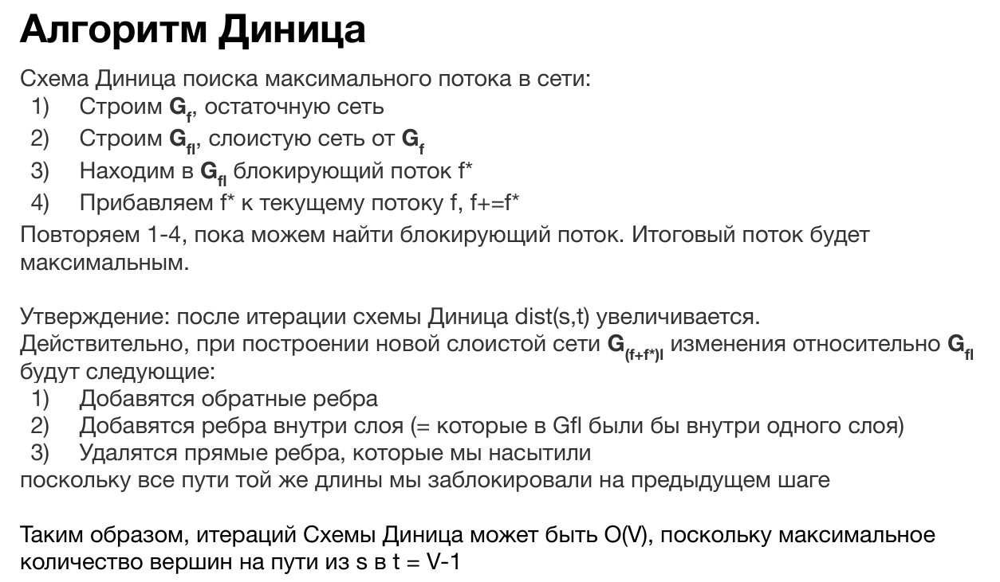

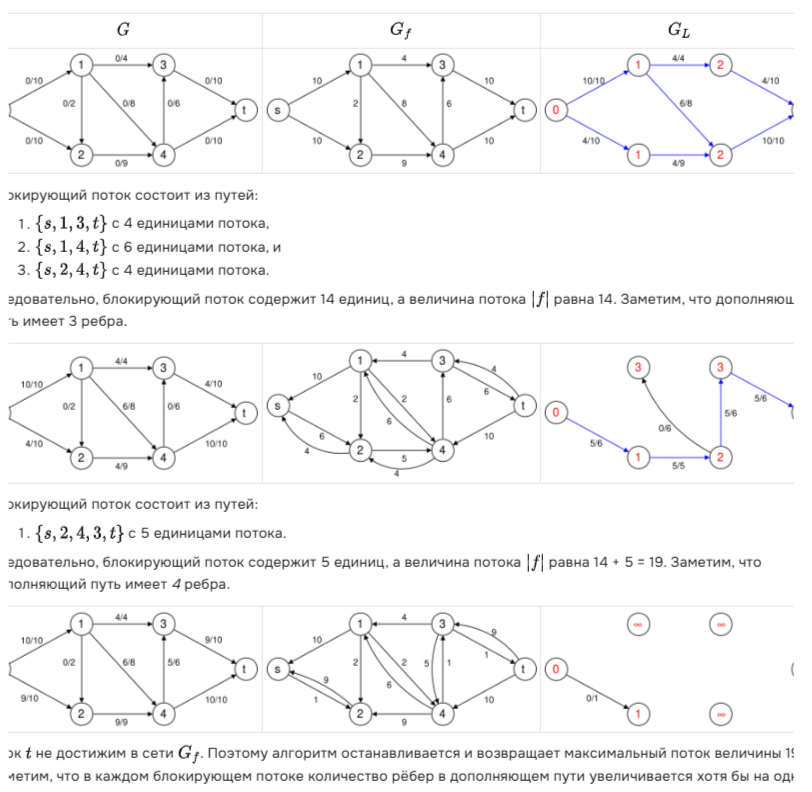

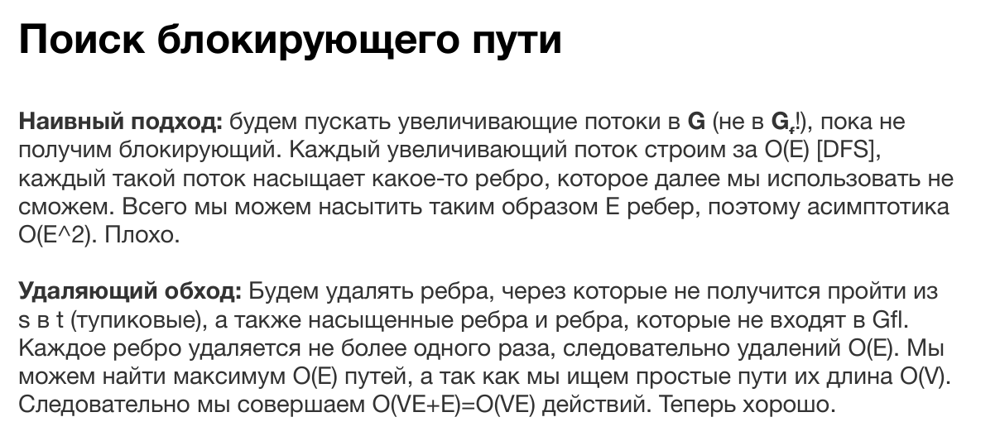

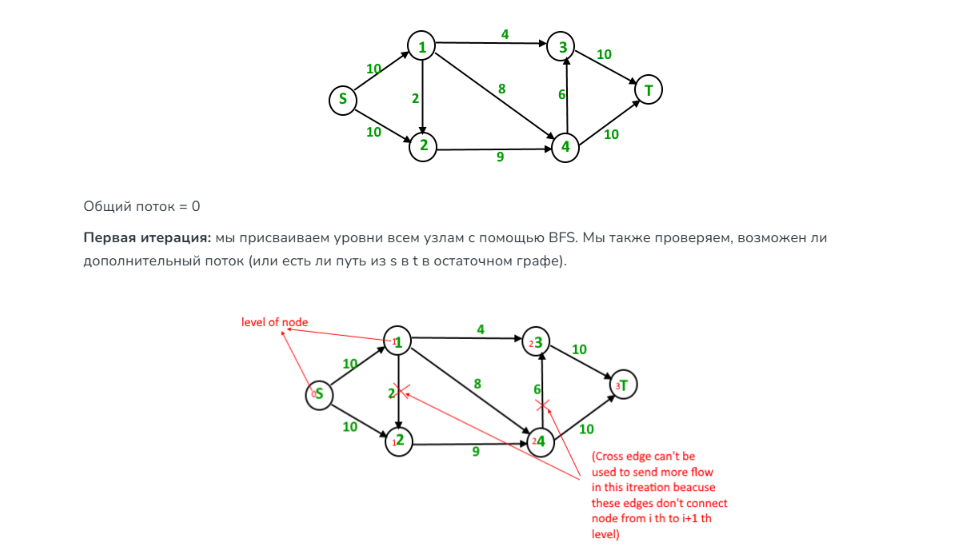

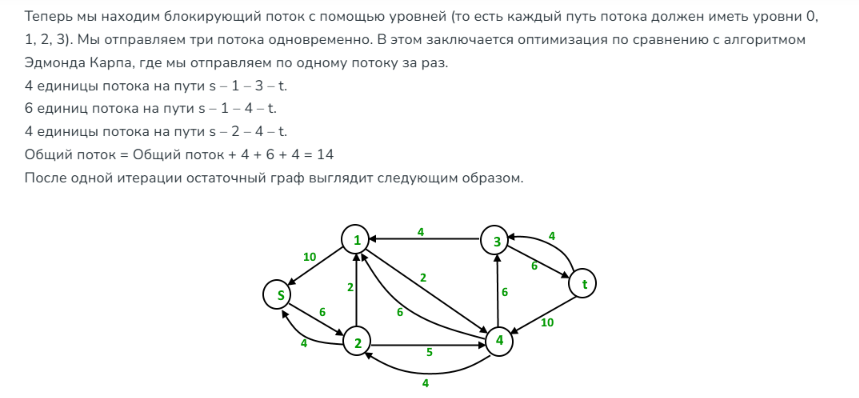

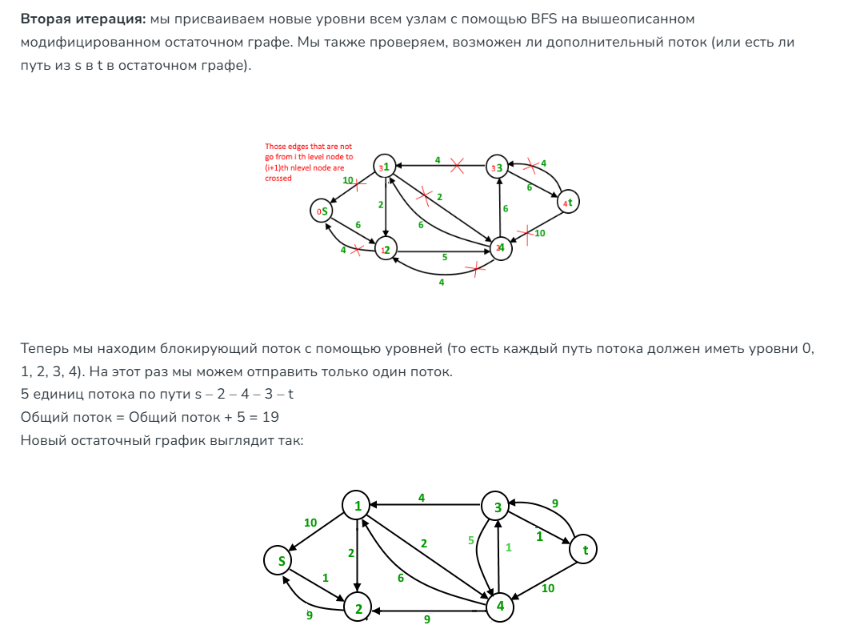

Третья итерация: мы запускаем BFS и создаём граф уровней. Мы также проверяем, возможен ли дополнительный поток, и продолжаем только в том случае, если это возможно. На этот раз в остаточном графе нет пути s-t, поэтому мы завершаем алгоритм.

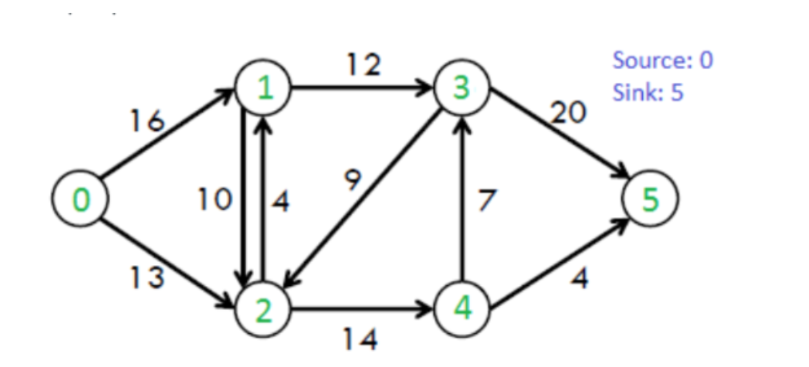

In [11]:
class Edge:
    def __init__(self, v, flow, C, rev):
        self.v = v  # Вершина, в которую ведет ребро
        self.flow = flow  # Текущий поток через ребро
        self.C = C  # Пропускная способность ребра
        self.rev = rev  # Индекс обратного ребра в списке смежности целевой вершины

class Graph:
    def __init__(self, V):
        self.adj = [[] for i in range(V)]  # Список смежности для хранения рёбер
        self.V = V  # Количество вершин в графе
        self.level = [0 for i in range(V)]  # Уровни вершин для BFS

    # Добавление ребра в граф
    def addEdge(self, u, v, C):
        # Прямое ребро: поток 0, пропускная способность C
        a = Edge(v, 0, C, len(self.adj[v]))
        # Обратное ребро: поток 0, пропускная способность 0
        b = Edge(u, 0, 0, len(self.adj[u]))
        self.adj[u].append(a)  # Добавляем прямое ребро в список смежности вершины u
        self.adj[v].append(b)  # Добавляем обратное ребро в список смежности вершины v

    # Поиск в ширину (BFS) для определения уровней вершин
    # и проверки возможности отправки потока от s к t
    def BFS(self, s, t):
        for i in range(self.V):
            self.level[i] = -1  # Инициализируем уровни всех вершин как -1

        self.level[s] = 0  # Уровень исходной вершины равен 0

        # Создаем очередь и добавляем в нее исходную вершину
        q = []
        q.append(s)
        while q:
            u = q.pop(0)  # Извлекаем вершину из очереди
            for i in range(len(self.adj[u])):
                e = self.adj[u][i]
                # Если вершина e.v не посещена и поток через ребро меньше пропускной способности
                if self.level[e.v] < 0 and e.flow < e.C:
                    self.level[e.v] = self.level[u] + 1  # Устанавливаем уровень вершины e.v
                    q.append(e.v)  # Добавляем вершину e.v в очередь

        # Если достигли стока, возвращаем True, иначе False
        return False if self.level[t] < 0 else True

    # Поиск в глубину (DFS) для отправки потока после того, как BFS определил уровни
    # flow: текущий поток, который можно отправить
    # start[]: массив для отслеживания следующего ребра для исследования
    # u: текущая вершина
    # t: сток
    def sendFlow(self, u, flow, t, start):
        if u == t:  # Если достигли стока, возвращаем поток
            return flow

        # Перебираем все ребра из текущей вершины
        while start[u] < len(self.adj[u]):
            e = self.adj[u][start[u]]  # Берем следующее ребро
            # Если уровень следующей вершины на 1 больше текущего и поток через ребро меньше пропускной способности
            if self.level[e.v] == self.level[u] + 1 and e.flow < e.C:
                # Находим минимальный поток от u до t
                curr_flow = min(flow, e.C - e.flow)
                temp_flow = self.sendFlow(e.v, curr_flow, t, start)  # Рекурсивно отправляем поток

                # Если поток больше нуля
                if temp_flow and temp_flow > 0:
                    e.flow += temp_flow  # Увеличиваем поток через текущее ребро
                    self.adj[e.v][e.rev].flow -= temp_flow  # Уменьшаем поток через обратное ребро
                    return temp_flow
            start[u] += 1  # Переходим к следующему ребру

    # Функция для нахождения максимального потока в графе
    def DinicMaxflow(self, s, t):
        if s == t:  # Если источник и сток совпадают, возвращаем -1
            return -1

        total = 0  # Инициализируем общий поток

        # Пока существует путь от источника к стоку
        while self.BFS(s, t) == True:
            start = [0 for i in range(self.V + 1)]  # Инициализируем массив start
            while True:
                flow = self.sendFlow(s, float('inf'), t, start)  # Отправляем поток
                if not flow:  # Если поток равен 0, выходим из цикла
                    break
                total += flow  # Добавляем поток к общему потоку

        return total  

g = Graph(6)
g.addEdge(0, 1, 16)
g.addEdge(0, 2, 13)
g.addEdge(1, 2, 10)
g.addEdge(1, 3, 12)
g.addEdge(2, 1, 4)
g.addEdge(2, 4, 14)
g.addEdge(3, 2, 9)
g.addEdge(3, 5, 20)
g.addEdge(4, 3, 7)
g.addEdge(4, 5, 4)
print("Максимальный поток", g.DinicMaxflow(0, 5))

Максимальный поток 23


In [18]:
class Edge:
    def __init__(self, v, flow, C, rev):
        self.v = v  # Вершина, в которую ведет ребро
        self.flow = flow  # Текущий поток через ребро
        self.C = C  # Пропускная способность ребра
        self.rev = rev  # Индекс обратного ребра в списке смежности целевой вершины

class Graph:
    def __init__(self, V):
        self.adj = [[] for i in range(V)]  
        self.V = V  
        self.level = [0 for i in range(V)]  

    def addEdge(self, u, v, C):
        a = Edge(v, 0, C, len(self.adj[v]))
        b = Edge(u, 0, 0, len(self.adj[u]))
        self.adj[u].append(a)  
        self.adj[v].append(b)  
        
    def BFS(self, s, t):
        for i in range(self.V):
            self.level[i] = -1 
        self.level[s] = 0  
        q = []
        q.append(s)
        while q:
            u = q.pop(0)  
            for i in range(len(self.adj[u])):
                e = self.adj[u][i]
                if self.level[e.v] < 0 and e.flow < e.C:
                    self.level[e.v] = self.level[u] + 1  
                    q.append(e.v)  
        return False if self.level[t] < 0 else True

    def sendFlow(self, u, flow, t, start):
        print(f"\nОтправляем поток из {u}, доступно {flow}")
        if u == t:
            print(f"Достигнут сток! Возвращаем {flow}")
            return flow
    
        for i in range(start[u], len(self.adj[u])):
            e = self.adj[u][i]
            print(f"  Проверяем ребро {u}->{e.v}: flow={e.flow}, cap={e.C}")
            
            if self.level[e.v] == self.level[u] + 1 and e.flow < e.C:
                curr_flow = min(flow, e.C - e.flow)
                print(f"    Можем отправить {curr_flow} (min({flow}, {e.C}-{e.flow}))")
                
                temp_flow = self.sendFlow(e.v, curr_flow, t, start)
                
                if temp_flow > 0:
                    print(f"    Получен поток {temp_flow} из {e.v}!")
                    print(f"    Обновляем:")
                    print(f"      Прямое ребро {u}->{e.v}: flow += {temp_flow} (было {e.flow})")
                    e.flow += temp_flow
                    
                    reverse_edge = self.adj[e.v][e.rev]
                    print(f"      Обратное ребро {e.v}->{reverse_edge.v}: flow -= {temp_flow} (было {reverse_edge.flow})")
                    reverse_edge.flow -= temp_flow
                    
                    return temp_flow
                else:
                    print(f"    Поток не прошёл дальше {e.v}")
            else:
                print(f"    Пропускаем (не подходит уровень или ребро заполнено)")
            
            start[u] += 1
        
        print(f"  Все рёбра из {u} обработаны, поток = 0")
        return 0

    
    def DinicMaxflow(self, s, t):
        if s == t:  
            return -1

        total = 0
        
        while self.BFS(s, t) == True:
            start = [0 for i in range(self.V + 1)]  
            while True:
                flow = self.sendFlow(s, float('inf'), t, start) 
                if not flow:  
                    break
                total += flow
                print(f" {total} ")

        return total  

g = Graph(6)
g.addEdge(0, 1, 16)
g.addEdge(0, 2, 13)
g.addEdge(1, 2, 10)
g.addEdge(1, 3, 12)
g.addEdge(2, 1, 4)
g.addEdge(2, 4, 14)
g.addEdge(3, 2, 9)
g.addEdge(3, 5, 20)
g.addEdge(4, 3, 7)
g.addEdge(4, 5, 4)
print("Максимальный поток", g.DinicMaxflow(0, 5))


Отправляем поток из 0, доступно inf
  Проверяем ребро 0->1: flow=0, cap=16
    Можем отправить 16 (min(inf, 16-0))

Отправляем поток из 1, доступно 16
  Проверяем ребро 1->0: flow=0, cap=0
    Пропускаем (не подходит уровень или ребро заполнено)
  Проверяем ребро 1->2: flow=0, cap=10
    Пропускаем (не подходит уровень или ребро заполнено)
  Проверяем ребро 1->3: flow=0, cap=12
    Можем отправить 12 (min(16, 12-0))

Отправляем поток из 3, доступно 12
  Проверяем ребро 3->1: flow=0, cap=0
    Пропускаем (не подходит уровень или ребро заполнено)
  Проверяем ребро 3->2: flow=0, cap=9
    Пропускаем (не подходит уровень или ребро заполнено)
  Проверяем ребро 3->5: flow=0, cap=20
    Можем отправить 12 (min(12, 20-0))

Отправляем поток из 5, доступно 12
Достигнут сток! Возвращаем 12
    Получен поток 12 из 5!
    Обновляем:
      Прямое ребро 3->5: flow += 12 (было 0)
      Обратное ребро 5->3: flow -= 12 (было 0)
    Получен поток 12 из 3!
    Обновляем:
      Прямое ребро 1->3: flow += 

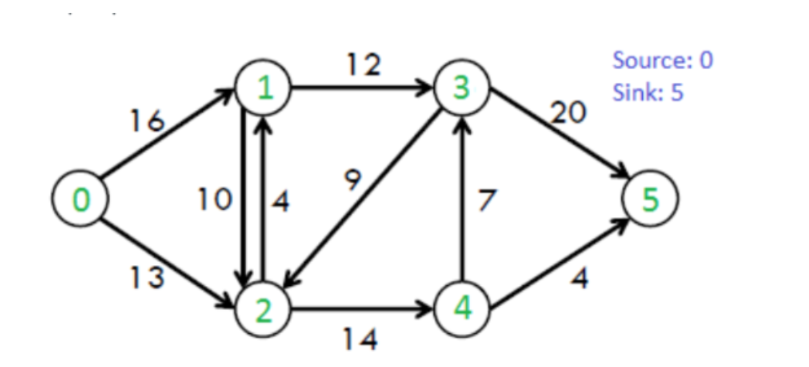

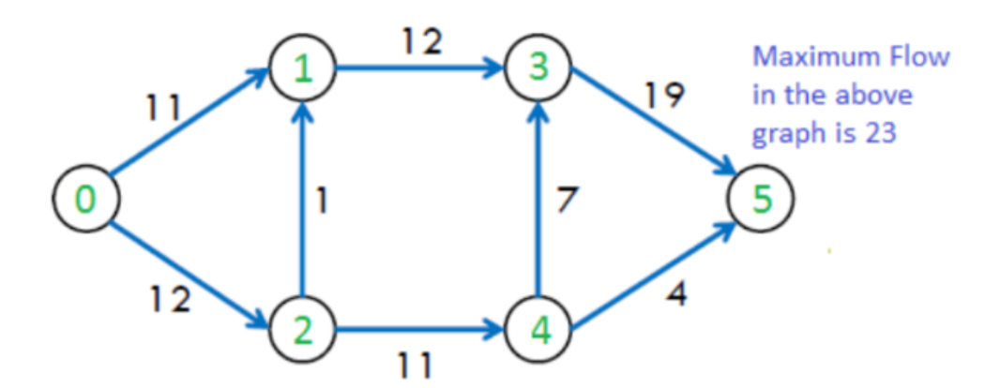

В методе BFS() условие e.flow < e.C автоматически отсекает обратные рёбра, так как у них C = 0

# Паросочетания

## Алгоритм Форда-Фалкерсона

Паросочетание в двудольном графе — это набор рёбер, выбранных таким образом, что никакие два ребра не имеют общей конечной точки. Максимальное паросочетание — это паросочетание максимального размера (максимального количества рёбер). Если к максимальному паросочетанию добавить какое-либо ребро, оно перестанет быть паросочетанием. Для заданного двудольного графа может существовать несколько максимальных паросочетаний.

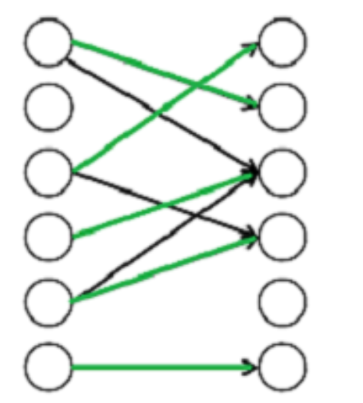

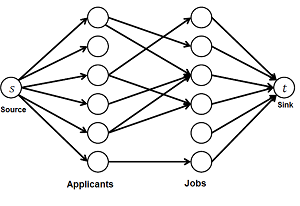

Пропускная способность каждого ребра равна 1 единице.

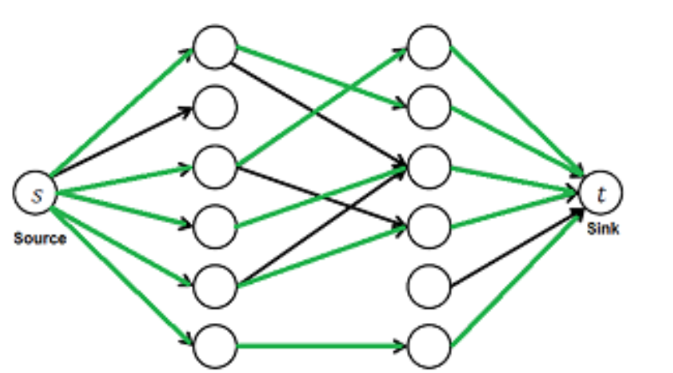

мы используем алгоритм Форда-Фалкерсона для поиска максимального потока в сети. Максимальный поток — это и есть искомое значение

In [33]:
from collections import deque

class FordFulkerson:
    def __init__(self, graph):
        self.graph = graph  # Матрица смежности двудольного графа
        self.X = len(graph)  # Количество вершин в множестве X
        self.Y = len(graph[0])  # Количество вершин в множестве Y
        self.source = self.X + self.Y  # Источник
        self.sink = self.X + self.Y + 1  # Сток
        self.size = self.X + self.Y + 2  # Размер сети

        # Построение остаточного графа
        self.residual_graph = [[0] * self.size for i in range(self.size)]

        # Соединяем источник с вершинами множества X
        for i in range(self.X):
            self.residual_graph[self.source][i] = 1

        # Соединяем вершины X с вершинами Y
        for i in range(self.X):
            for j in range(self.Y):
                if self.graph[i][j]:  # Если есть ребро
                    self.residual_graph[i][self.X + j] = 1

        # Соединяем вершины Y со стоком
        for j in range(self.Y):
            self.residual_graph[self.X + j][self.sink] = 1

    def bfs(self, parent):
        """Поиск увеличивающего пути с использованием BFS"""
        visited = [False] * self.size
        queue = deque([self.source])
        visited[self.source] = True

        while queue:
            u = queue.popleft()
            for v in range(self.size):
                if not visited[v] and self.residual_graph[u][v] > 0:
                    queue.append(v)
                    visited[v] = True
                    parent[v] = u
                    if v == self.sink:
                        return True
        return False

    def ford_fulkerson(self):
        """Алгоритм Форда-Фалкерсона для максимального паросочетания"""
        parent = [-1] * self.size
        max_matching = 0

        while self.bfs(parent):
            # Найдем минимальную пропускную способность на найденном пути
            v = self.sink
            path_flow = float('Inf')
            while v != self.source:
                u = parent[v]
                path_flow = min(path_flow, self.residual_graph[u][v])
                v = u

            # Обновим остаточный граф
            v = self.sink
            while v != self.source:
                u = parent[v]
                self.residual_graph[u][v] -= path_flow
                self.residual_graph[v][u] += path_flow
                v = u

            max_matching += path_flow  # Увеличиваем счетчик паросочетаний

        return max_matching


# Пример графа (X -> Y)
graph = [[0, 1, 1, 0, 0, 0],
         [1, 0, 0, 1, 0, 0],
         [0, 0, 1, 0, 0, 0],
         [0, 0, 1, 1, 0, 0],
         [0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 1]]

ff = FordFulkerson(graph)
print("Максимальное паросочетание:", ff.ford_fulkerson())

Максимальное паросочетание: 5


Примечание!

## Алгоритм Хопкрофта-Карпа

Этот алгоритм быстрее, чем Форда-Фалкерсона, потому что использует многократный поиск увеличивающих путей с помощью BFS и DFS, а не один за раз.

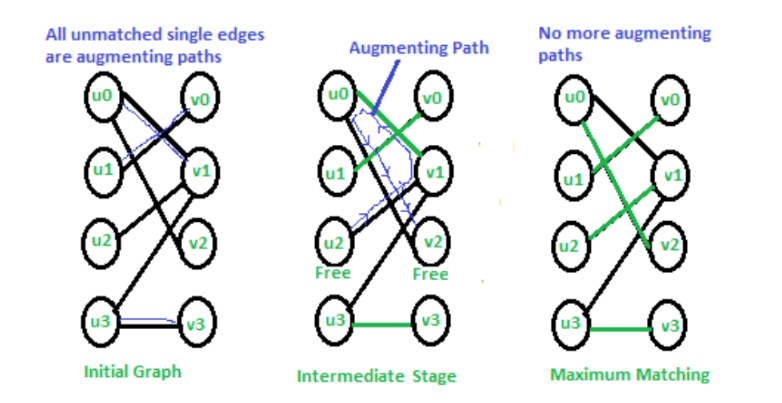

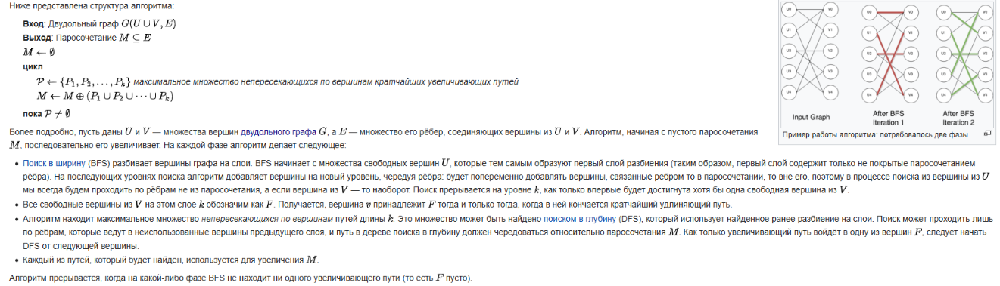

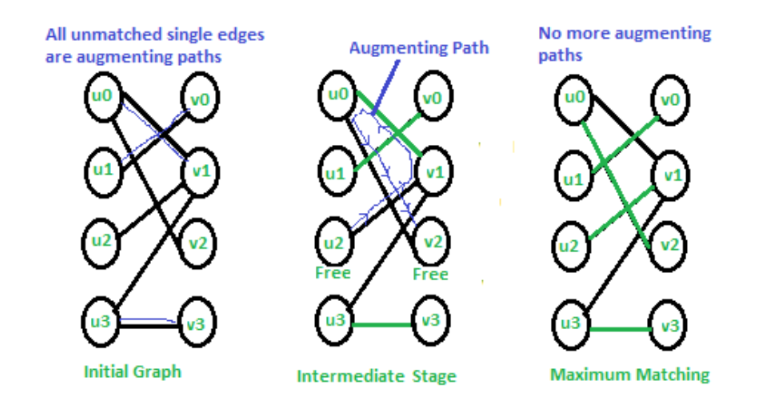

In [ ]:
BFS:

Находит кратчайшие пути из свободных вершин X

Обновляет расстояния до вершин

Возвращает True, если существует путь до стока

DFS:

Рекурсивно ищет увеличивающий путь

Обновляет паросочетание, если путь найден

Основной алгоритм (hopcroftKarpFlow):

Инициализирует паросочетания (pairU, pairV) как пустые

Пока BFS находит увеличивающие пути:

Для каждой свободной вершины X пытается найти увеличивающий путь через DFS

Увеличивает счётчик паросочетаний при успехе

self.residual_graph[u][self.x_size + v] > 0: проверяет, существует ли в остаточной сети (residual_graph) ненулевой поток по ребру из вершины u в X в вершину v в Y.

In [1]:
from collections import deque

INF = float('inf')

class hopcroftKarp:
    def __init__(self, x_size, y_size, edges):
        self.x_size = x_size
        self.y_size = y_size
        self.size = x_size + y_size
        
        self.residual_graph = [[0] * self.size for i in range(self.size)]
        
        for x, y in edges:
            self.residual_graph[x][x_size + y] = 1
        
        
    def bfs(self, dist, pairU, pairV, iteration):
        print(f"\nИтерация {iteration}: BFS строит слоистый граф")
        queue = deque()
        for u in range(self.x_size):
            if pairU[u] == -1:
                dist[u] = 0
                queue.append(u)
                print(f"  Вершина {u} свободна, добавляем в очередь")
            else:
                dist[u] = INF
        
        found_free = False
        while queue:
            u = queue.popleft()
            for v in range(self.y_size):
                if self.residual_graph[u][self.x_size + v] > 0:
                    if pairV[v] == -1:
                        found_free = True
                    else:
                        next_u = pairV[v]
                        if dist[next_u] == INF:
                            dist[next_u] = dist[u] + 1
                            queue.append(next_u)
                            print(f"  Добавляем {next_u} в очередь (из {u} через {v})")
        return found_free

    def dfs(self, u, dist, pairU, pairV):
        for v in range(self.y_size):
            if self.residual_graph[u][self.x_size + v] > 0:
                if pairV[v] == -1:
                    pairV[v] = u
                    pairU[u] = v
                    print(f"  Выбрано ребро ({u}, {v})")
                    return True
                else:
                    next_u = pairV[v]
                    if dist[next_u] == dist[u] + 1 and self.dfs(next_u, dist, pairU, pairV):
                        pairV[v] = u
                        pairU[u] = v
                        print(f"  Переназначено ребро ({u}, {v})")
                        return True
        dist[u] = INF
        return False
    
    def hopcroftKarp(self):
        pairU = [-1] * self.x_size
        pairV = [-1] * self.y_size
        dist = [INF] * self.x_size
        
        max_matching = 0
        iteration = 1  
        
        while self.bfs(dist, pairU, pairV, iteration):
            print(f"\nИтерация {iteration}: DFS ищет увеличивающие пути")
            for u in range(self.x_size):
                if pairU[u] == -1 and self.dfs(u, dist, pairU, pairV):
                    max_matching += 1
            iteration += 1
        
        print("\nФинальное паросочетание:")
        for u in range(self.x_size):
            if pairU[u] != -1:
                print(f"  ({u}, {pairU[u]})")
        return max_matching

X_size = 4
Y_size = 4
edges = [(0, 1), (0, 2), (1, 0), (2, 1), (3, 1), (3, 3)]

hk_flow = hopcroftKarp(X_size, Y_size, edges)
print("Максимальное паросочетание:", hk_flow.hopcroftKarp())


Итерация 1: BFS строит слоистый граф
  Вершина 0 свободна, добавляем в очередь
  Вершина 1 свободна, добавляем в очередь
  Вершина 2 свободна, добавляем в очередь
  Вершина 3 свободна, добавляем в очередь

Итерация 1: DFS ищет увеличивающие пути
  Выбрано ребро (0, 1)
  Выбрано ребро (1, 0)
  Выбрано ребро (3, 3)

Итерация 2: BFS строит слоистый граф
  Вершина 2 свободна, добавляем в очередь
  Добавляем 0 в очередь (из 2 через 1)

Итерация 2: DFS ищет увеличивающие пути
  Выбрано ребро (0, 2)
  Переназначено ребро (2, 1)

Итерация 3: BFS строит слоистый граф

Финальное паросочетание:
  (0, 2)
  (1, 0)
  (2, 1)
  (3, 3)
Максимальное паросочетание: 4


# Алгоритм А*

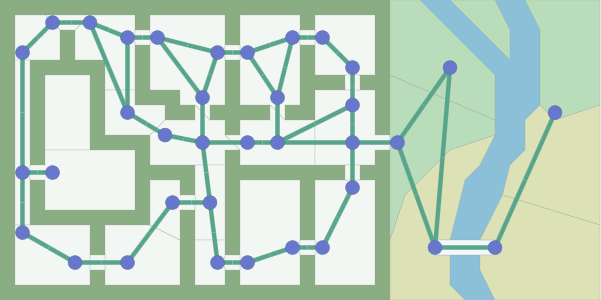

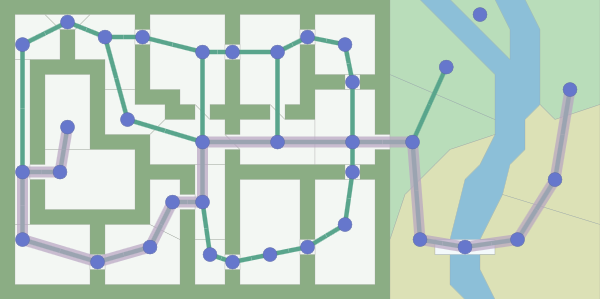

In [22]:
import heapq

def dijkstra(graph, start):
    n = len(graph)
    INF = float('inf')
    dist = {node: INF for node in graph}
    dist[start] = 0
    pq = [(0, start)]  # (расстояние, вершина)

    while pq:
        curr_dist, node = heapq.heappop(pq)

        if curr_dist > dist[node]:
            continue

        for neighbor, weight in graph[node].items():
            distance = curr_dist + weight
            if distance < dist[neighbor]:
                dist[neighbor] = distance
                heapq.heappush(pq, (distance, neighbor))

    return dist

# Пример использования
graph = {
    'A': {'B': 1, 'C': 4},
    'B': {'A': 1, 'C': 2, 'D': 5},
    'C': {'A': 4, 'B': 2, 'D': 1},
    'D': {'B': 5, 'C': 1}
}
start_node = 'A'
print(dijkstra(graph, start_node))

{'A': 0, 'B': 1, 'C': 3, 'D': 4}


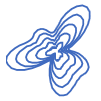

Алгоритм Дейкстры (также называемый поиском с равномерной стоимостью) позволяет нам задавать приоритеты исследования путей. Вместо равномерного исследования всех возможных путей он отдаёт предпочтение путям с низкой стоимостью. 

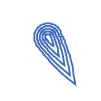

A* — это модификация алгоритма Дейкстры, оптимизированная для единственной конечной точки. Алгоритм Дейкстры может находить пути ко всем точкам, A* находит путь к одной точке. Он отдаёт приоритет путям, которые ведут ближе к цели.

Путь: ['A', 'C', 'D']


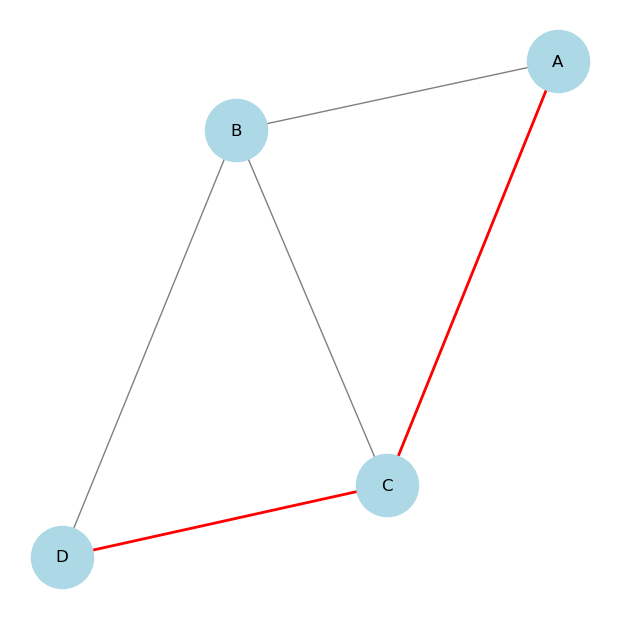

In [20]:
import collections
import matplotlib.pyplot as plt
import networkx as nx

def bfs(graph, start, goal):
    queue = collections.deque([start])
    came_from = {start: None}
    
    while queue:
        node = queue.popleft()
        
        if node == goal:
            path = []
            while node is not None:
                path.append(node)
                node = came_from[node]
            return path[::-1]
        
        for neighbor in graph[node]:
            if neighbor not in came_from:
                came_from[neighbor] = node
                queue.append(neighbor)
    
    return None  # Путь не найден

# Пример использования
graph = {
    'A': {'B', 'C'},
    'B': {'A', 'C', 'D'},
    'C': {'A', 'B', 'D'},
    'D': {'B', 'C'}
}
start_node = 'A'
goal_node = 'D'
path = bfs(graph, start_node, goal_node)
print("Путь:", path)

# Визуализация графа
G = nx.Graph()
for node in graph:
    for neighbor in graph[node]:
        G.add_edge(node, neighbor)

pos = nx.spring_layout(G, seed=42)  
plt.figure(figsize=(6, 6))
nx.draw(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=2000, font_size=12)
plt.axis("off")  # Убираем оси для чистоты

if path:
    path_edges = list(zip(path, path[1:]))
    nx.draw_networkx_edges(G, pos, edgelist=path_edges, edge_color='red', width=2)

plt.show()

Найденный путь: ['A', 'B', 'C', 'D']


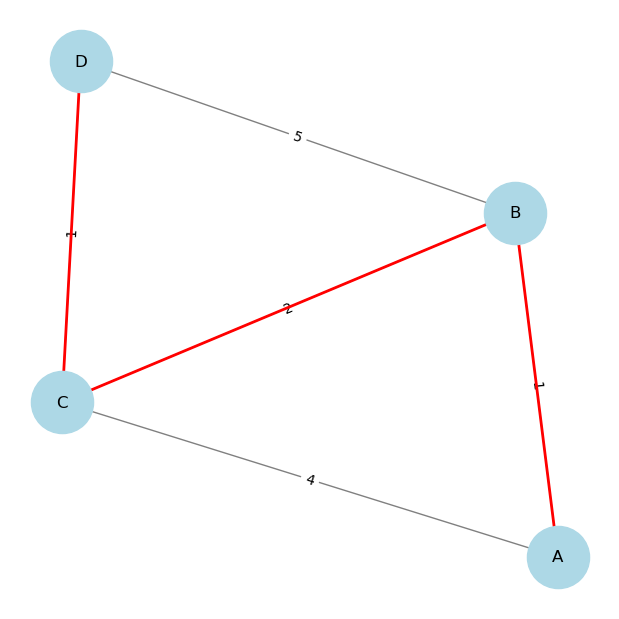

In [14]:
import heapq
import matplotlib.pyplot as plt
import networkx as nx

# Эвристическая функция для A* алгоритма
def heuristic(a, b):
    return 1  # Поскольку у нас взвешенный граф, используем минимальную эвристику

# Реализация алгоритма A*
def a_star(graph, start, goal):
    INF = float('inf')  # Бесконечность для инициализации расстояний
    
    # Инициализация расстояний до всех вершин как бесконечность
    dist = {node: INF for node in graph}
    dist[start] = 0  # Расстояние до стартовой вершины = 0
    
    # Очередь с приоритетом для хранения вершин для обработки
    pq = [(0, start)]  # (приоритет = f_score, вершина)
    
    # Для восстановления пути
    came_from = {}
    
    # f_score = g_score (расстояние от старта) + h_score (эвристика)
    f_score = {node: INF for node in graph}
    f_score[start] = heuristic(start, goal)  # Начальное значение f_score для старта
    
    while pq:
        # Извлекаем вершину с наименьшим f_score
        priority, node = heapq.heappop(pq)
        
        # Если достигли цели, восстанавливаем путь
        if node == goal:
            path = []
            while node in came_from:
                path.append(node)
                node = came_from[node]
            path.append(start)
            return path[::-1]  # Возвращаем путь от начала до конца
        
        # Перебираем всех соседей текущей вершины
        for neighbor, weight in graph[node].items():
            # Предполагаемое расстояние от старта до соседа
            tentative_g_score = dist[node] + weight
            
            # Если нашли более короткий путь
            if tentative_g_score < dist[neighbor]:
                came_from[neighbor] = node  # Запоминаем, откуда пришли
                dist[neighbor] = tentative_g_score  # Обновляем расстояние
                f_score[neighbor] = tentative_g_score + heuristic(neighbor, goal)  # Обновляем f_score
                heapq.heappush(pq, (f_score[neighbor], neighbor))  # Добавляем в очередь
    
    return None  # Если путь не найден

# Пример использования алгоритма
graph = {
    'A': {'B': 1, 'C': 4},
    'B': {'A': 1, 'C': 2, 'D': 5},
    'C': {'A': 4, 'B': 2, 'D': 1},
    'D': {'B': 5, 'C': 1}
}
start_node = 'A'
goal_node = 'D'

path = a_star(graph, start_node, goal_node)
print("Найденный путь:", path)

G = nx.Graph()

for node in graph:
    for neighbor, weight in graph[node].items():
        G.add_edge(node, neighbor, weight=weight)

pos = nx.spring_layout(G)

edges = G.edges(data=True)
labels = {(u, v): d['weight'] for u, v, d in edges}

plt.figure(figsize=(6, 6))

nx.draw(G, pos, 
        with_labels=True, 
        node_color='lightblue', 
        edge_color='gray', 
        node_size=2000, 
        font_size=12)

nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)

if path:
    path_edges = list(zip(path, path[1:]))
    nx.draw_networkx_edges(G, pos, 
                          edgelist=path_edges, 
                          edge_color='red', 
                          width=2)

plt.show()